In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 419 kB 30.7 MB/s 


In [ ]:
import torch
import torchvision
from torch import nn
import numpy as np
import matplotlib.pyplot as plt
from tqdm import trange, tqdm
from torch.utils.data import Dataset, DataLoader, random_split
import os
import pickle
from PIL import Image
from torchvision import transforms
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure

## Modelli Luca (prova vae ipynb copia e incolla)

In [ ]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


In [ ]:
class AutoEncodeDataset(Dataset):
    """"""

    def __init__(self, dataset_gt, dataset_blur):
        self.dataset_gt = dataset_gt
        self.dataset_blur = dataset_blur

    def __len__(self):
        return len(self.dataset_gt)

    def __getitem__(self, idx):
        x, _ = self.dataset_blur.__getitem__(idx)
        y, _ = self.dataset_gt.__getitem__(idx)
        return x, y

In [ ]:
def metric_insight(psnr_vec, ssim_vec, dataset):
  print('AVG PSNR: '+str(psnr_vec.mean()))
  print('MAX PSNR: '+str(psnr_vec.max()))
  print('AVG SSIM: '+str(ssim_vec.mean()))
  print('MAX SSIM: '+str(ssim_vec.max()))

def mymetrics(model, device, dataset, verbose=True):
  psnr, ssim = PeakSignalNoiseRatio().to(device), StructuralSimilarityIndexMeasure().to(device)
  psnr_values = np.zeros(len(dataset))
  ssim_values = np.zeros(len(dataset))
  model.to(device)
  model.eval()
  for ix, sample in tqdm(enumerate(dataset)):
    img = sample[0].unsqueeze(0).to(device)
    lab = sample[1].unsqueeze(0).to(device)
    with torch.no_grad():
        rec_img  = model(img)
    psnr_values[ix], ssim_values[ix] = psnr(rec_img, lab).cpu().numpy(), ssim(rec_img, lab).cpu().numpy()

  if (verbose==True):
    print('\n')
    metric_insight(psnr_values, ssim_values, dataset)
  return psnr_values, ssim_values

In [ ]:
initial_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.Normalize(0.5,0.5)])

blur_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.GaussianBlur(9,4),
    transforms.Normalize(0.5,0.5)])

In [ ]:
data_dir = 'data_lfw/'

train_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=blur_transform)
)

test_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=blur_transform)
)

  0%|          | 0/243346528 [00:00<?, ?it/s]

Extracting data_lfw/lfw-py/lfw-funneled.tgz to data_lfw/lfw-py


  0%|          | 0/66403 [00:00<?, ?it/s]

  0%|          | 0/94727 [00:00<?, ?it/s]

Files already downloaded and verified
Using downloaded and verified file: data_lfw/lfw-py/lfw-funneled.tgz
Extracting data_lfw/lfw-py/lfw-funneled.tgz to data_lfw/lfw-py


  0%|          | 0/28334 [00:00<?, ?it/s]

Using downloaded and verified file: data_lfw/lfw-py/lfw-names.txt
Files already downloaded and verified


In [ ]:
batch_size = 8

N_val = int(len(train_dataset)*0.2)
train_dataset_red, val_dataset = random_split(train_dataset, 
                                 lengths=[len(train_dataset)-N_val, N_val], 
                                 generator=torch.Generator().manual_seed(42))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0,)
train_dataloader_red = DataLoader(train_dataset_red, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [ ]:
def plotrescale(data):
    return np.dstack(data)*0.5 + 0.5

In [ ]:
class VConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

        self.avg = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )

        self.log_var = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )
        
    def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
        sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
        return mu + torch.randn_like(mu) * sigma
        #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        avg = self.avg(x)
        log_var = self.log_var(x)
        x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var
    
### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Blurred image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), 'VCAE/state_dict'+str(epoch)+'.pth')

    with open('VCAE_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
VConvAut = VConvAutoencoder()

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': VConvAut.encoder.parameters()},
    {'params': VConvAut.decoder.parameters()},
    {'params': VConvAut.avg.parameters()},
    {'params': VConvAut.log_var.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

In [ ]:
!mkdir VCAE

EPOCH 1/15


Train batch loss: 0.019638: 100%|██████████| 1191/1191 [01:31<00:00, 13.04it/s]




	 VALIDATION - EPOCH 1/15 - loss: 0.011505




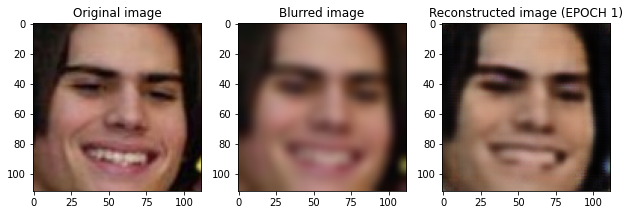

EPOCH 2/15


Train batch loss: 0.015911: 100%|██████████| 1191/1191 [01:33<00:00, 12.72it/s]




	 VALIDATION - EPOCH 2/15 - loss: 0.010448




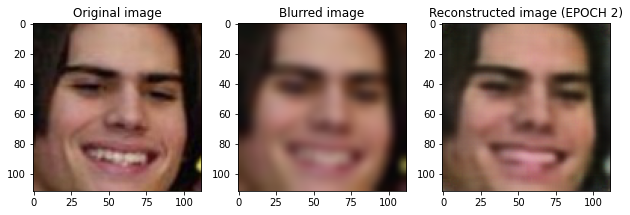

EPOCH 3/15


Train batch loss: 0.027004: 100%|██████████| 1191/1191 [01:34<00:00, 12.58it/s]




	 VALIDATION - EPOCH 3/15 - loss: 0.007151




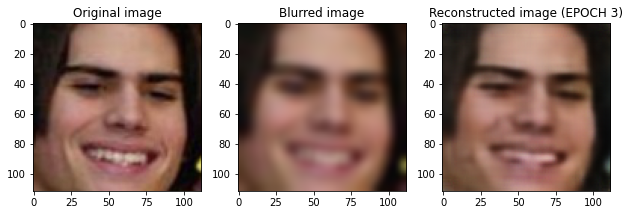

EPOCH 4/15


Train batch loss: 0.015713: 100%|██████████| 1191/1191 [01:36<00:00, 12.40it/s]




	 VALIDATION - EPOCH 4/15 - loss: 0.006740




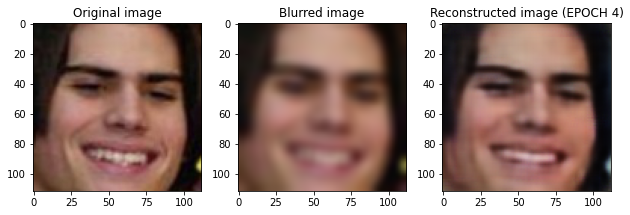

EPOCH 5/15


Train batch loss: 0.009332: 100%|██████████| 1191/1191 [01:36<00:00, 12.35it/s]




	 VALIDATION - EPOCH 5/15 - loss: 0.005327




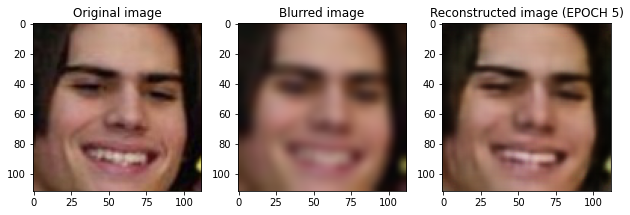

EPOCH 6/15


Train batch loss: 0.008899: 100%|██████████| 1191/1191 [01:37<00:00, 12.25it/s]




	 VALIDATION - EPOCH 6/15 - loss: 0.005819




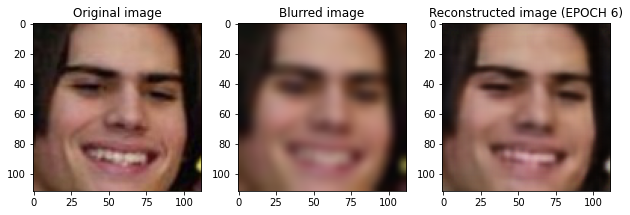

EPOCH 7/15


Train batch loss: 0.011633: 100%|██████████| 1191/1191 [01:37<00:00, 12.23it/s]




	 VALIDATION - EPOCH 7/15 - loss: 0.005563




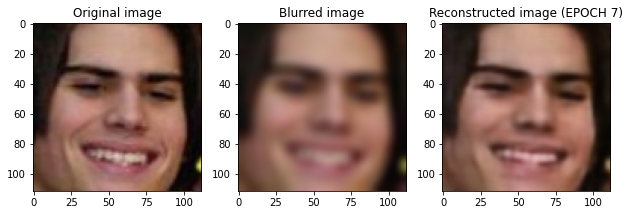

EPOCH 8/15


Train batch loss: 0.008092: 100%|██████████| 1191/1191 [01:38<00:00, 12.12it/s]




	 VALIDATION - EPOCH 8/15 - loss: 0.004867




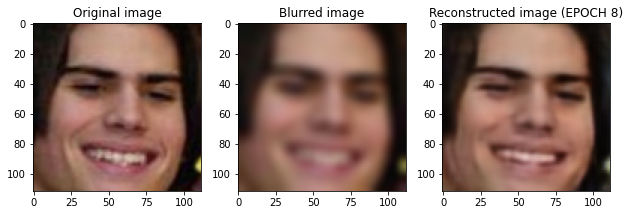

EPOCH 9/15


Train batch loss: 0.026933: 100%|██████████| 1191/1191 [01:40<00:00, 11.89it/s]




	 VALIDATION - EPOCH 9/15 - loss: 0.006332




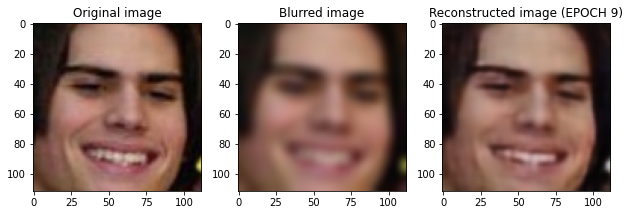

EPOCH 10/15


Train batch loss: 0.011868: 100%|██████████| 1191/1191 [01:40<00:00, 11.89it/s]




	 VALIDATION - EPOCH 10/15 - loss: 0.005013




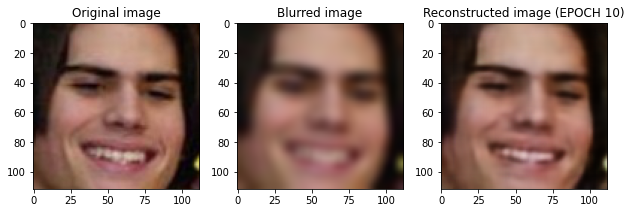

EPOCH 11/15


Train batch loss: 0.008827: 100%|██████████| 1191/1191 [01:41<00:00, 11.76it/s]




	 VALIDATION - EPOCH 11/15 - loss: 0.005288




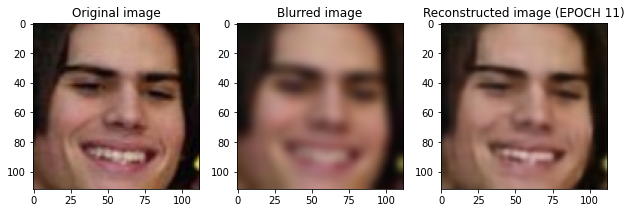

EPOCH 12/15


Train batch loss: 0.007222: 100%|██████████| 1191/1191 [01:41<00:00, 11.74it/s]




	 VALIDATION - EPOCH 12/15 - loss: 0.005074




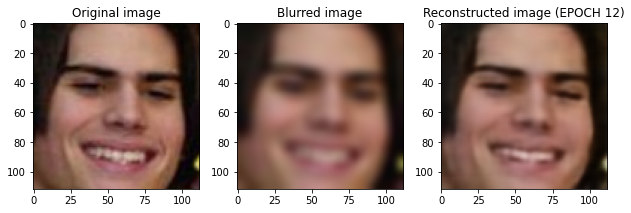

EPOCH 13/15


Train batch loss: 0.013176: 100%|██████████| 1191/1191 [01:44<00:00, 11.43it/s]




	 VALIDATION - EPOCH 13/15 - loss: 0.006744




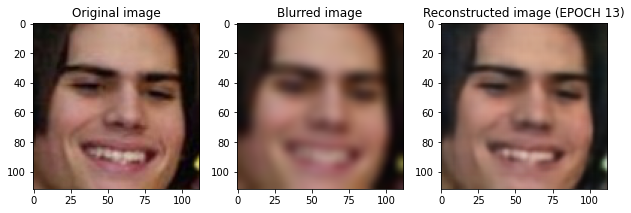

EPOCH 14/15


Train batch loss: 0.010484: 100%|██████████| 1191/1191 [01:44<00:00, 11.40it/s]




	 VALIDATION - EPOCH 14/15 - loss: 0.004322




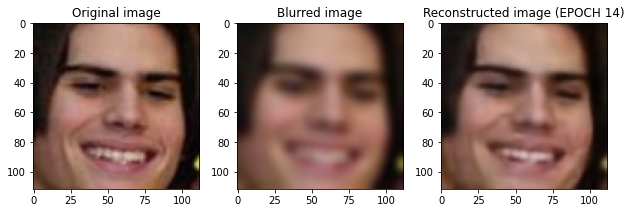

EPOCH 15/15


Train batch loss: 0.007548: 100%|██████████| 1191/1191 [01:45<00:00, 11.34it/s]




	 VALIDATION - EPOCH 15/15 - loss: 0.006724




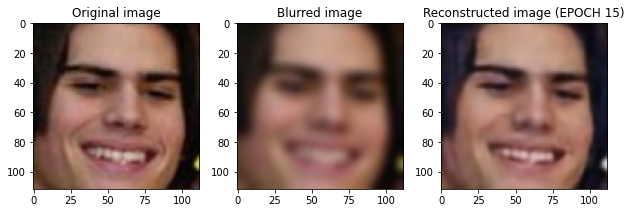

In [ ]:
VCAE_loss = run_training(VConvAut, 15, train_dataloader, test_dataloader, optim, loss_fn, device)

In [ ]:
!zip -r VCAE.zip VCAE

  adding: VCAE/ (stored 0%)
  adding: VCAE/state_dict7.pth (deflated 6%)
  adding: VCAE/state_dict1.pth (deflated 7%)
  adding: VCAE/state_dict0.pth (deflated 7%)
  adding: VCAE/state_dict4.pth (deflated 7%)
  adding: VCAE/state_dict14.pth (deflated 5%)
  adding: VCAE/state_dict6.pth (deflated 7%)
  adding: VCAE/state_dict10.pth (deflated 5%)
  adding: VCAE/state_dict9.pth (deflated 5%)
  adding: VCAE/state_dict13.pth (deflated 5%)
  adding: VCAE/state_dict8.pth (deflated 6%)
  adding: VCAE/state_dict3.pth (deflated 7%)
  adding: VCAE/state_dict5.pth (deflated 7%)
  adding: VCAE/state_dict2.pth (deflated 7%)
  adding: VCAE/state_dict11.pth (deflated 5%)
  adding: VCAE/state_dict12.pth (deflated 5%)


In [ ]:
plt.figure(figsize=(8,6))
plt.plot(VCAE_loss)
plt.show()

In [ ]:
best_VCAE = VConvAutoencoder()
best_VCAE.load_state_dict(torch.load('VCAE/state_dict26.pth'))

## perc loss

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 419 kB 29.5 MB/s 


In [ ]:
import torch
import torchvision
from torch import nn
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import trange, tqdm
from torch.utils.data import Dataset, DataLoader, random_split
import os
from PIL import Image
from torchvision import transforms
import pickle
import torch.nn.functional as F

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


In [ ]:
class AutoEncodeDataset(Dataset):
    """"""

    def __init__(self, dataset_gt, dataset_blur):
        self.dataset_gt = dataset_gt
        self.dataset_blur = dataset_blur

    def __len__(self):
        return len(self.dataset_gt)

    def __getitem__(self, idx):
        x, _ = self.dataset_blur.__getitem__(idx)
        y, _ = self.dataset_gt.__getitem__(idx)
        return x, y

In [ ]:
initial_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.Normalize(0.5,0.5)])

blur_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.GaussianBlur(9,4),
    transforms.Normalize(0.5,0.5)])

In [ ]:
data_dir = 'lfw_torch/'

train_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=blur_transform)
)

test_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=blur_transform)
)

  0%|          | 0/243346528 [00:00<?, ?it/s]

Extracting lfw_torch/lfw-py/lfw-funneled.tgz to lfw_torch/lfw-py


  0%|          | 0/66403 [00:00<?, ?it/s]

  0%|          | 0/94727 [00:00<?, ?it/s]

Files already downloaded and verified
Using downloaded and verified file: lfw_torch/lfw-py/lfw-funneled.tgz
Extracting lfw_torch/lfw-py/lfw-funneled.tgz to lfw_torch/lfw-py


  0%|          | 0/28334 [00:00<?, ?it/s]

Using downloaded and verified file: lfw_torch/lfw-py/lfw-names.txt
Files already downloaded and verified


In [ ]:
batch_size = 8

N_val = int(len(train_dataset)*0.2)
train_dataset_red, val_dataset = random_split(train_dataset, 
                                 lengths=[len(train_dataset)-N_val, N_val], 
                                 generator=torch.Generator().manual_seed(42))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0,)
train_dataloader_red = DataLoader(train_dataset_red, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [ ]:
def plotrescale(data):
    return np.dstack(data)*0.5 + 0.5

### perc loss cae base

In [ ]:
vgg = torchvision.models.vgg16(pretrained = True) # c'è anche vgg16_bn con la batch normaliz

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [ ]:
vgg.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
up = nn.Upsample(scale_factor = 2)
f = vgg.features[:16].to(device)

def perc_loss(x1, x2): # le 2 immagini o i 2 batch (non cambia, fa la mse di due tensori, indipendentemente da 1 o batch_size come prima dim.)
    # inoltre anche Upsample si aspetta che le prime due dim. siano numero e canale, tocca solo le ultime 2 (cfr docs)
    return F.mse_loss(f(up(x1)), f(up(x2))) # versioni hd -> vgg16 -> mse

In [ ]:
class ConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

    #     self.avg = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )

    #     self.log_var = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )
        
    # def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
    #     sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
    #     return mu + torch.randn_like(mu) * sigma
    #     #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        # avg = self.avg(x)
        # log_var = self.log_var(x)
        # x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var
    
### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device, save_folder):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Blurred image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), f'{save_folder}/state_dict'+str(epoch)+'.pth')

    with open(f'{save_folder}_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
ConvAut = ConvAutoencoder()

### Define the loss function
loss_fn = perc_loss #torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': ConvAut.encoder.parameters()},
    {'params': ConvAut.decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

In [ ]:
!mkdir CAE_pl

mkdir: cannot create directory ‘CAE_pl’: File exists


EPOCH 1/15


Train batch loss: 1.513114: 100%|██████████| 1191/1191 [05:12<00:00,  3.81it/s]




	 VALIDATION - EPOCH 1/15 - loss: 1.383706




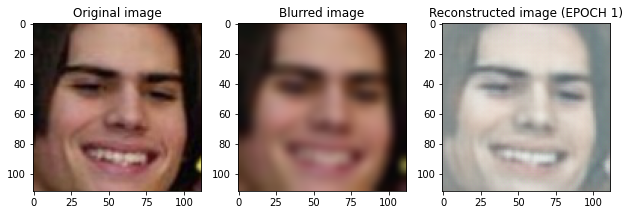

EPOCH 2/15


Train batch loss: 1.026576: 100%|██████████| 1191/1191 [05:10<00:00,  3.83it/s]




	 VALIDATION - EPOCH 2/15 - loss: 1.066354




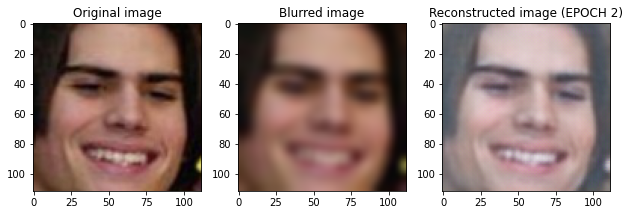

EPOCH 3/15


Train batch loss: 0.967192: 100%|██████████| 1191/1191 [05:12<00:00,  3.81it/s]




	 VALIDATION - EPOCH 3/15 - loss: 0.908369




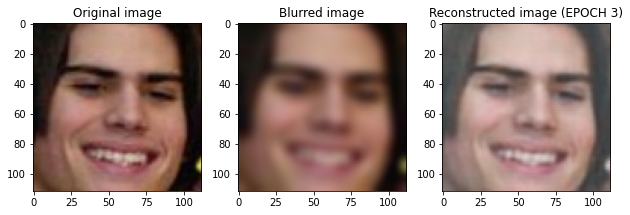

EPOCH 4/15


Train batch loss: 0.986818: 100%|██████████| 1191/1191 [05:13<00:00,  3.80it/s]




	 VALIDATION - EPOCH 4/15 - loss: 0.839675




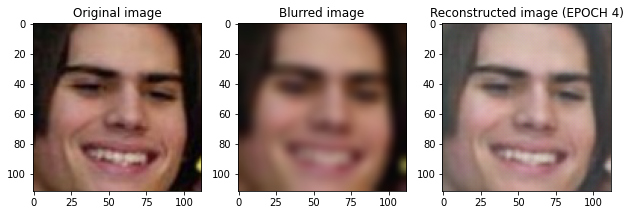

EPOCH 5/15


Train batch loss: 0.838597: 100%|██████████| 1191/1191 [05:14<00:00,  3.78it/s]




	 VALIDATION - EPOCH 5/15 - loss: 0.790393




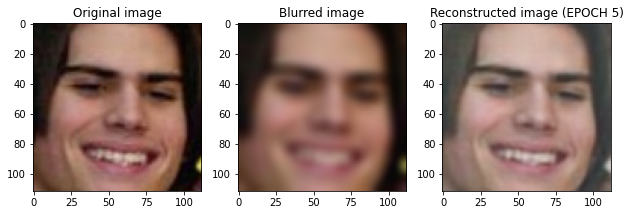

EPOCH 6/15


Train batch loss: 0.911536: 100%|██████████| 1191/1191 [05:15<00:00,  3.77it/s]




	 VALIDATION - EPOCH 6/15 - loss: 0.949294




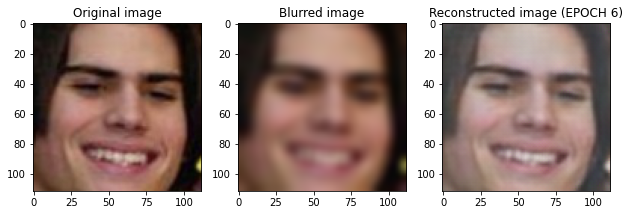

EPOCH 7/15


Train batch loss: 0.642338: 100%|██████████| 1191/1191 [05:16<00:00,  3.76it/s]




	 VALIDATION - EPOCH 7/15 - loss: 0.764400




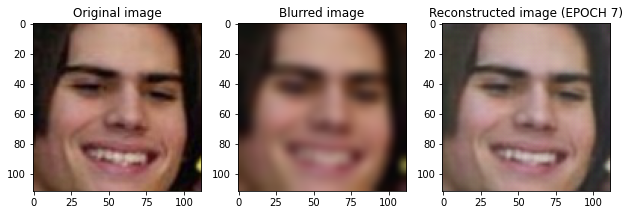

EPOCH 8/15


Train batch loss: 0.756474: 100%|██████████| 1191/1191 [05:19<00:00,  3.73it/s]




	 VALIDATION - EPOCH 8/15 - loss: 0.723734




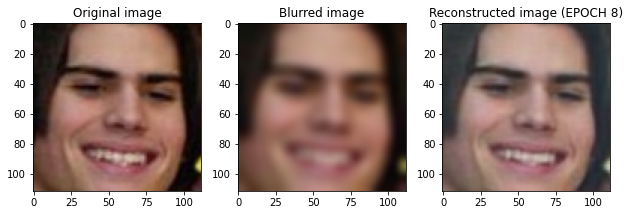

EPOCH 9/15


Train batch loss: 0.723635: 100%|██████████| 1191/1191 [05:19<00:00,  3.72it/s]




	 VALIDATION - EPOCH 9/15 - loss: 0.695994




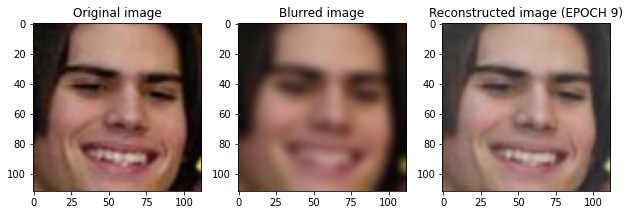

EPOCH 10/15


Train batch loss: 0.768096: 100%|██████████| 1191/1191 [05:22<00:00,  3.70it/s]




	 VALIDATION - EPOCH 10/15 - loss: 0.666433




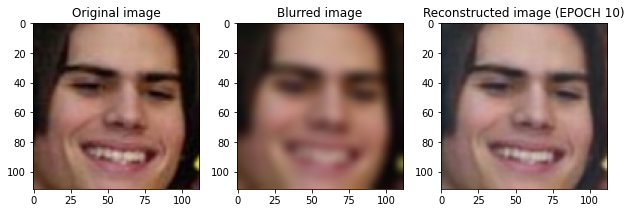

EPOCH 11/15


Train batch loss: 0.572761: 100%|██████████| 1191/1191 [05:31<00:00,  3.60it/s]




	 VALIDATION - EPOCH 11/15 - loss: 0.640393




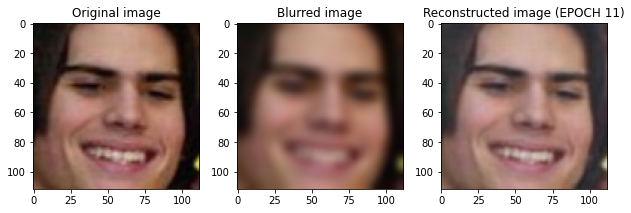

EPOCH 12/15


Train batch loss: 0.775715: 100%|██████████| 1191/1191 [05:33<00:00,  3.57it/s]




	 VALIDATION - EPOCH 12/15 - loss: 0.623568




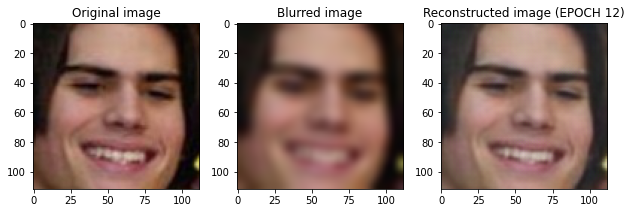

EPOCH 13/15


Train batch loss: 0.655695: 100%|██████████| 1191/1191 [05:32<00:00,  3.58it/s]




	 VALIDATION - EPOCH 13/15 - loss: 0.600758




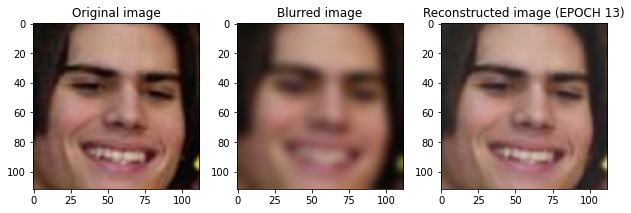

EPOCH 14/15


Train batch loss: 0.492188: 100%|██████████| 1191/1191 [05:25<00:00,  3.66it/s]




	 VALIDATION - EPOCH 14/15 - loss: 0.596768




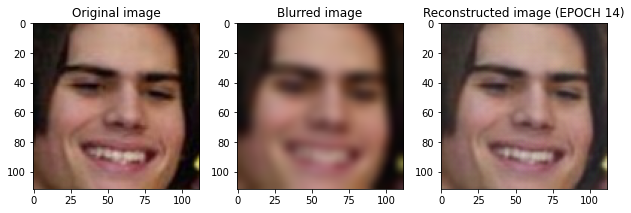

EPOCH 15/15


Train batch loss: 0.522697: 100%|██████████| 1191/1191 [05:29<00:00,  3.61it/s]




	 VALIDATION - EPOCH 15/15 - loss: 0.686418




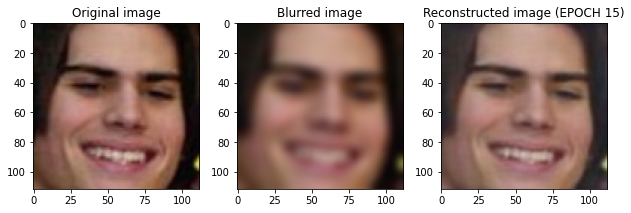

In [ ]:
CAE_loss = run_training(ConvAut, 15, train_dataloader, test_dataloader, optim, loss_fn, device, 'CAE_pl') # magari meno iter. perché più lento e più bravo?

In [ ]:
!zip -r CAE_pl.zip CAE_pl

  adding: CAE_pl/ (stored 0%)
  adding: CAE_pl/state_dict7.pth (deflated 7%)
  adding: CAE_pl/state_dict1.pth (deflated 8%)
  adding: CAE_pl/state_dict0.pth (deflated 8%)
  adding: CAE_pl/state_dict4.pth (deflated 7%)
  adding: CAE_pl/state_dict14.pth (deflated 7%)
  adding: CAE_pl/state_dict6.pth (deflated 7%)
  adding: CAE_pl/state_dict10.pth (deflated 7%)
  adding: CAE_pl/state_dict9.pth (deflated 7%)
  adding: CAE_pl/state_dict13.pth (deflated 7%)
  adding: CAE_pl/state_dict8.pth (deflated 7%)
  adding: CAE_pl/state_dict3.pth (deflated 7%)
  adding: CAE_pl/state_dict5.pth (deflated 7%)
  adding: CAE_pl/state_dict2.pth (deflated 7%)
  adding: CAE_pl/state_dict11.pth (deflated 7%)
  adding: CAE_pl/state_dict12.pth (deflated 7%)


### perc loss cae + normaliz vgg

In [ ]:
# normaliz_inv = torchvision.transforms.Normalize(mean = -0.5, std = 2)
normaliz_vgg = torchvision.transforms.Normalize(mean = [0.485, 0.456, 0.406], std = [0.229, 0.224, 0.225])

# normaliz_tot = torchvision.transforms.Compose([normaliz_inv, normaliz_vgg])

def perc_loss_normaliz_vgg(x1, x2):
    # y1, y2 = up(normaliz_inv(x1)), up(normaliz_inv(x2))
    # y1, y2 = normaliz_vgg(y1), normaliz_vgg(y2)
    y1, y2 = normaliz_vgg(up(x1)), normaliz_vgg(up(x2))
    return F.mse_loss(f(y1), f(y2)) # versioni hd -> normaliz vgg -> vgg16 -> mse

# forse meglio di no. Così forse abituiamo la rete a fare affidamento su una normalizzazione artificiosa, 
# messa a posteriori sull'output. E poi che fa, ce la teniamo nell'output anche tipo per fare i grafici?
# allora stiamo modificando l'architettura inserendo un layer di normalizzazione... è giusto fare così?

# provo lo stesso quando finisce di calcolare sopra

# in realtà non so quanto serva, evidentemente il colore riesce a recuperarlo solo con molta calma
# (perlomeno se paragonato alle forme)

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
ConvAut_norm = ConvAutoencoder()

### Define the loss function
loss_fn = perc_loss_normaliz_vgg #torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': ConvAut_norm.encoder.parameters()},
    {'params': ConvAut_norm.decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

In [ ]:
!mkdir CAE_pl_normaliz_vgg

EPOCH 1/5


Train batch loss: 12.825795: 100%|██████████| 1191/1191 [05:12<00:00,  3.82it/s]




	 VALIDATION - EPOCH 1/5 - loss: 11.789639




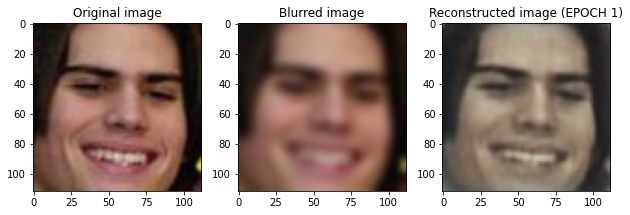

EPOCH 2/5


Train batch loss: 9.345900: 100%|██████████| 1191/1191 [05:12<00:00,  3.81it/s]




	 VALIDATION - EPOCH 2/5 - loss: 9.562927




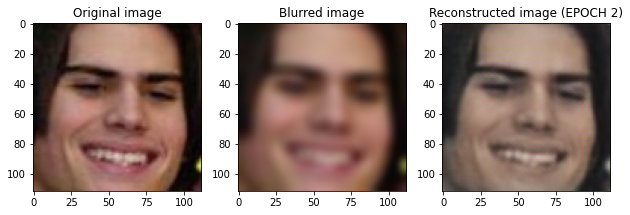

EPOCH 3/5


Train batch loss: 8.398214: 100%|██████████| 1191/1191 [05:14<00:00,  3.79it/s]




	 VALIDATION - EPOCH 3/5 - loss: 8.442170




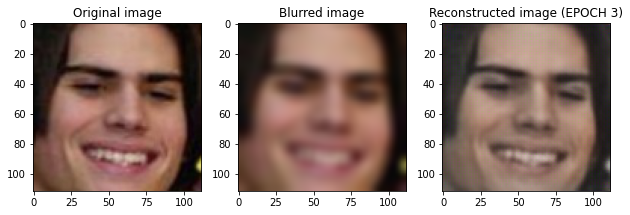

EPOCH 4/5


Train batch loss: 9.004395: 100%|██████████| 1191/1191 [05:15<00:00,  3.78it/s]




	 VALIDATION - EPOCH 4/5 - loss: 8.079502




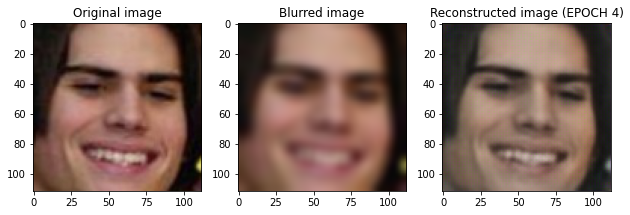

EPOCH 5/5


Train batch loss: 8.523294: 100%|██████████| 1191/1191 [05:16<00:00,  3.77it/s]




	 VALIDATION - EPOCH 5/5 - loss: 7.399046




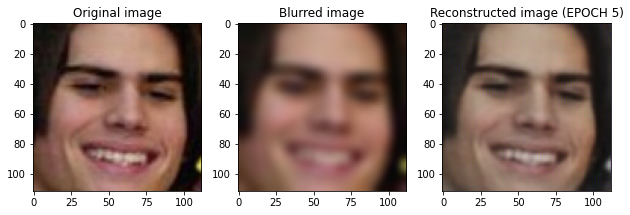

In [ ]:
CAE_norm_loss = run_training(ConvAut_norm, 5, train_dataloader, test_dataloader, optim, loss_fn, device, 'CAE_pl_normaliz_vgg')

In [ ]:
!zip -r CAE_pl_normaliz_vgg.zip CAE_pl_normaliz_vgg

  adding: CAE_pl_normaliz_vgg/ (stored 0%)
  adding: CAE_pl_normaliz_vgg/state_dict1.pth (deflated 8%)
  adding: CAE_pl_normaliz_vgg/state_dict0.pth (deflated 8%)
  adding: CAE_pl_normaliz_vgg/state_dict4.pth (deflated 7%)
  adding: CAE_pl_normaliz_vgg/state_dict3.pth (deflated 7%)
  adding: CAE_pl_normaliz_vgg/state_dict2.pth (deflated 8%)


### perc loss vae

In [ ]:
vgg = torchvision.models.vgg16(pretrained = True) # c'è anche vgg16_bn con la batch normaliz

In [ ]:
vgg.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [ ]:
up = nn.Upsample(scale_factor = 2)
f = vgg.features[:16].to(device)

def perc_loss(x1, x2): # le 2 immagini o i 2 batch (non cambia, fa la mse di due tensori, indipendentemente da 1 o batch_size come prima dim.)
    # inoltre anche Upsample si aspetta che le prime due dim. siano numero e canale, tocca solo le ultime 2 (cfr docs)
    return F.mse_loss(f(up(x1)), f(up(x2))) # versioni hd -> vgg16 -> mse

In [ ]:
class VConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

        self.avg = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )

        self.log_var = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )
        
    def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
        sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
        return mu + torch.randn_like(mu) * sigma
        #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        avg = self.avg(x)
        log_var = self.log_var(x)
        x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var
    
### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device, save_folder):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Blurred image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), f'{save_folder}/state_dict'+str(epoch)+'.pth')

    with open(f'{save_folder}_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
VConvAut = VConvAutoencoder()

### Define the loss function
loss_fn = perc_loss #torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': VConvAut.encoder.parameters()},
    {'params': VConvAut.decoder.parameters()},
    {'params': VConvAut.avg.parameters()},
    {'params': VConvAut.log_var.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

In [ ]:
!mkdir VCAE_pl

EPOCH 1/5


Train batch loss: 2.122046: 100%|██████████| 1191/1191 [05:07<00:00,  3.88it/s]




	 VALIDATION - EPOCH 1/5 - loss: 1.683321




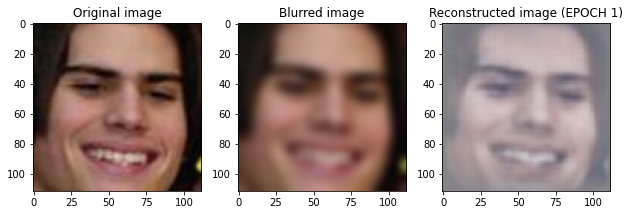

EPOCH 2/5


Train batch loss: 1.006022: 100%|██████████| 1191/1191 [05:07<00:00,  3.88it/s]




	 VALIDATION - EPOCH 2/5 - loss: 1.171082




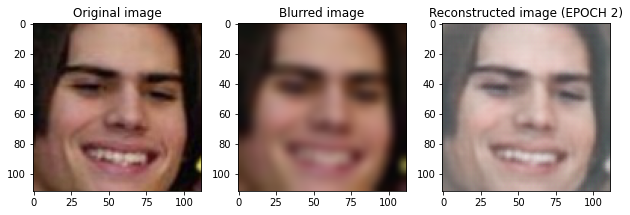

EPOCH 3/5


Train batch loss: 0.775159: 100%|██████████| 1191/1191 [05:08<00:00,  3.86it/s]




	 VALIDATION - EPOCH 3/5 - loss: 1.001116




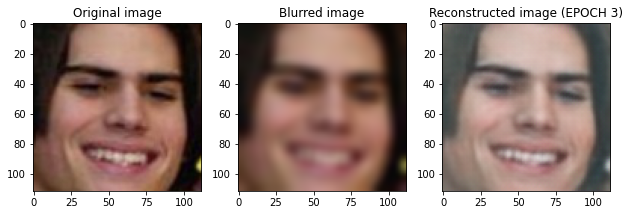

EPOCH 4/5


Train batch loss: 0.821223: 100%|██████████| 1191/1191 [05:09<00:00,  3.85it/s]




	 VALIDATION - EPOCH 4/5 - loss: 0.891573




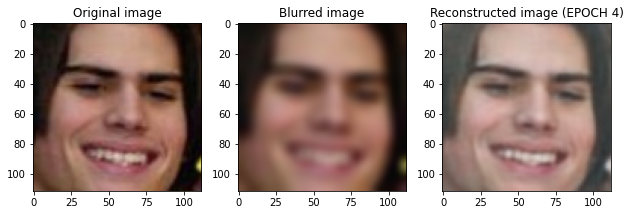

EPOCH 5/5


Train batch loss: 1.205433: 100%|██████████| 1191/1191 [05:10<00:00,  3.84it/s]




	 VALIDATION - EPOCH 5/5 - loss: 0.818361




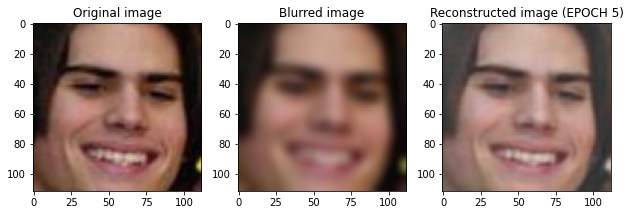

In [ ]:
VCAE_loss = run_training(VConvAut, 5, train_dataloader, test_dataloader, optim, loss_fn, device, 'VCAE_pl')

In [ ]:
!zip -r VCAE_pl.zip VCAE_pl

  adding: VCAE_pl/ (stored 0%)
  adding: VCAE_pl/state_dict1.pth (deflated 8%)
  adding: VCAE_pl/state_dict0.pth (deflated 8%)
  adding: VCAE_pl/state_dict4.pth (deflated 7%)
  adding: VCAE_pl/state_dict3.pth (deflated 7%)
  adding: VCAE_pl/state_dict2.pth (deflated 7%)


### perc loss mista CAE

In [ ]:
class PercLoss(nn.MSELoss): # _Loss # https://pytorch.org/docs/stable/_modules/torch/nn/modules/loss.html
    __constants__ = ['reduction']

    def __init__(self, scale_factor, device, size_average = None, reduce = None, reduction: str = 'mean') -> None:
        super(PercLoss, self).__init__(size_average, reduce, reduction)
        
        self.up = nn.Upsample(scale_factor = scale_factor)
        self.device = device

        self.vgg = torchvision.models.vgg16(pretrained = True)
        self.vgg.eval()
        self.f = self.vgg.features[:16].to(self.device)

    def forward(self, input: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
        return F.mse_loss(self.f(self.up(input)), self.f(self.up(target)), reduction = self.reduction)

In [ ]:
class MixPercLoss(nn.MSELoss):
    __constants__ = ['reduction']

    def __init__(self, rho, scale_factor, device, size_average = None, reduce = None, reduction: str = 'mean') -> None:
        super(MixPercLoss, self).__init__(size_average, reduce, reduction)
        
        self.up = nn.Upsample(scale_factor = scale_factor)
        self.device = device
        self.rho = rho

        self.vgg = torchvision.models.vgg16(pretrained = True)
        self.vgg.eval()
        self.f = self.vgg.features[:16].to(self.device)

    def forward(self, input: torch.Tensor, target: torch.Tensor) -> torch.Tensor:
        perceptual_loss = F.mse_loss(self.f(self.up(input)), self.f(self.up(target)), reduction = self.reduction)
        pixel_loss = F.mse_loss(input, target, reduction = self.reduction)
        return self.rho * pixel_loss + perceptual_loss

In [ ]:
class ConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

    #     self.avg = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )

    #     self.log_var = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )
        
    # def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
    #     sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
    #     return mu + torch.randn_like(mu) * sigma
    #     #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        # avg = self.avg(x)
        # log_var = self.log_var(x)
        # x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var
    
### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device, save_folder):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Blurred image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), f'{save_folder}/state_dict'+str(epoch)+'.pth')

    with open(f'{save_folder}_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

#### $\rho = 0.5$

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
ConvAut = ConvAutoencoder()

### Define the loss function
loss_fn = MixPercLoss(rho = 0.5, scale_factor = 2, device = device) #perc_loss #torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': ConvAut.encoder.parameters()},
    {'params': ConvAut.decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth


  0%|          | 0.00/528M [00:00<?, ?B/s]

In [ ]:
!mkdir CAE_mpl_05

EPOCH 1/5


Train batch loss: 1.316056: 100%|██████████| 1191/1191 [05:09<00:00,  3.85it/s]




	 VALIDATION - EPOCH 1/5 - loss: 1.432204




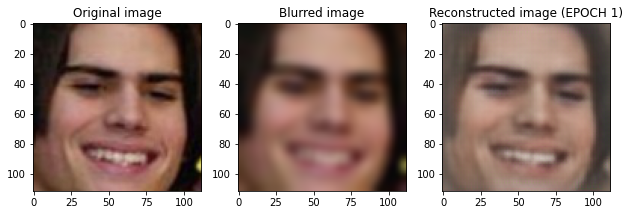

EPOCH 2/5


Train batch loss: 1.164359: 100%|██████████| 1191/1191 [05:09<00:00,  3.85it/s]




	 VALIDATION - EPOCH 2/5 - loss: 1.142587




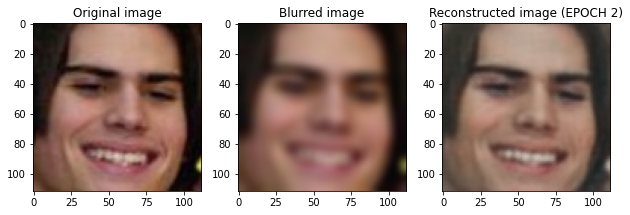

EPOCH 3/5


Train batch loss: 1.010257: 100%|██████████| 1191/1191 [05:10<00:00,  3.84it/s]




	 VALIDATION - EPOCH 3/5 - loss: 1.004471




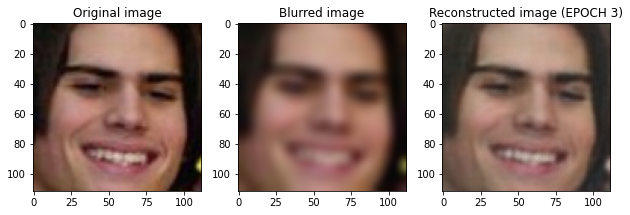

EPOCH 4/5


Train batch loss: 0.918845: 100%|██████████| 1191/1191 [05:11<00:00,  3.82it/s]




	 VALIDATION - EPOCH 4/5 - loss: 0.922555




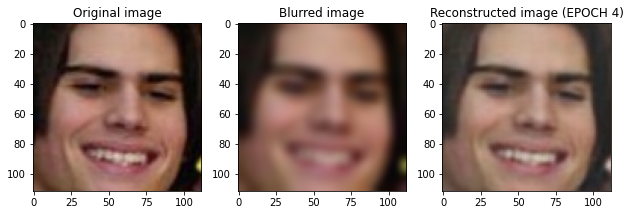

EPOCH 5/5


Train batch loss: 0.847840: 100%|██████████| 1191/1191 [05:13<00:00,  3.80it/s]




	 VALIDATION - EPOCH 5/5 - loss: 0.793263




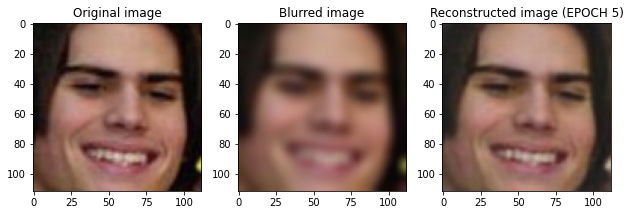

In [ ]:
CAE_mpl_05_loss = run_training(ConvAut, 5, train_dataloader, test_dataloader, optim, loss_fn, device, 'CAE_mpl_05')

In [ ]:
!zip -r CAE_mpl_05.zip CAE_mpl_05

  adding: CAE_mpl_05/ (stored 0%)
  adding: CAE_mpl_05/state_dict0.pth (deflated 8%)
  adding: CAE_mpl_05/state_dict1.pth (deflated 8%)
  adding: CAE_mpl_05/state_dict2.pth (deflated 7%)
  adding: CAE_mpl_05/state_dict4.pth (deflated 7%)
  adding: CAE_mpl_05/state_dict3.pth (deflated 7%)


#### $\rho = 1$

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
ConvAut = ConvAutoencoder()

### Define the loss function
loss_fn = MixPercLoss(rho = 1, scale_factor = 2, device = device) #perc_loss #torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': ConvAut.encoder.parameters()},
    {'params': ConvAut.decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:209: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  f"The parameter '{pretrained_param}' is deprecated since 0.13 and will be removed in 0.15, "
/usr/local/lib/python3.7/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
!mkdir CAE_mpl_1

EPOCH 1/5


Train batch loss: 1.313751: 100%|██████████| 1191/1191 [05:08<00:00,  3.86it/s]




	 VALIDATION - EPOCH 1/5 - loss: 1.463865




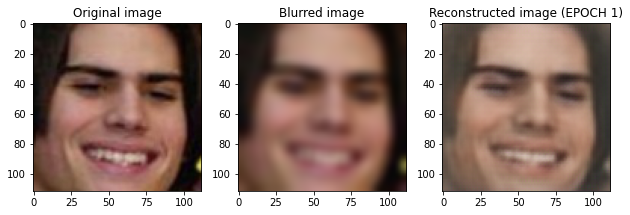

EPOCH 2/5


Train batch loss: 1.226607: 100%|██████████| 1191/1191 [05:10<00:00,  3.84it/s]




	 VALIDATION - EPOCH 2/5 - loss: 1.257195




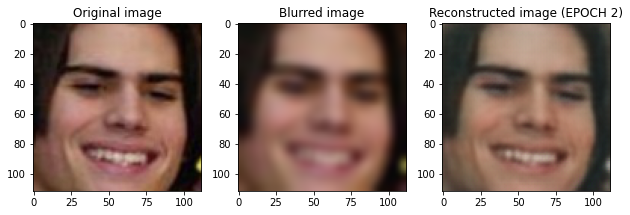

EPOCH 3/5


Train batch loss: 0.999567: 100%|██████████| 1191/1191 [05:11<00:00,  3.82it/s]




	 VALIDATION - EPOCH 3/5 - loss: 1.005806




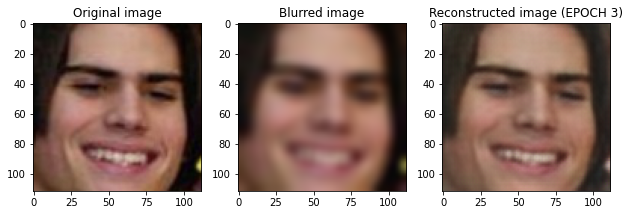

EPOCH 4/5


Train batch loss: 0.942280: 100%|██████████| 1191/1191 [05:12<00:00,  3.81it/s]




	 VALIDATION - EPOCH 4/5 - loss: 0.963319




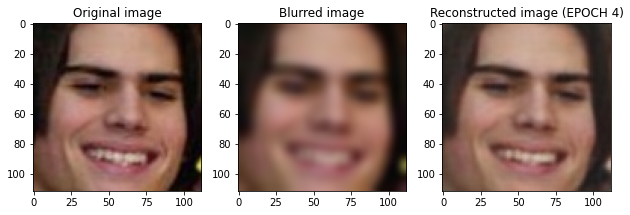

EPOCH 5/5


Train batch loss: 0.860844: 100%|██████████| 1191/1191 [05:13<00:00,  3.79it/s]




	 VALIDATION - EPOCH 5/5 - loss: 0.822642




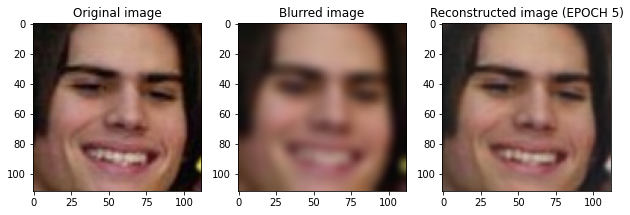

In [ ]:
CAE_mpl_1_loss = run_training(ConvAut, 5, train_dataloader, test_dataloader, optim, loss_fn, device, 'CAE_mpl_1')

In [ ]:
!zip -r CAE_mpl_1.zip CAE_mpl_1

  adding: CAE_mpl_1/ (stored 0%)
  adding: CAE_mpl_1/state_dict0.pth (deflated 8%)
  adding: CAE_mpl_1/state_dict1.pth (deflated 8%)
  adding: CAE_mpl_1/state_dict2.pth (deflated 7%)
  adding: CAE_mpl_1/state_dict4.pth (deflated 7%)
  adding: CAE_mpl_1/state_dict3.pth (deflated 7%)


## vae 1*1 con KL

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 419 kB 30.3 MB/s 


In [ ]:
import torch
import torchvision
from torch import nn
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import trange, tqdm
from torch.utils.data import Dataset, DataLoader, random_split
import os
from PIL import Image
from torchvision import transforms
import pickle
# from torchmetrics import PSNR, SSIM
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
import torch.nn.functional as F
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


In [ ]:
class AutoEncodeDataset(Dataset):
    """"""

    def __init__(self, dataset_gt, dataset_blur):
        self.dataset_gt = dataset_gt
        self.dataset_blur = dataset_blur

    def __len__(self):
        return len(self.dataset_gt)

    def __getitem__(self, idx):
        x, _ = self.dataset_blur.__getitem__(idx)
        y, _ = self.dataset_gt.__getitem__(idx)
        return x, y

In [ ]:
initial_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.Normalize(0.5,0.5)])

blur_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.GaussianBlur(9,4),
    transforms.Normalize(0.5,0.5)])

In [ ]:
data_dir = 'data_lfw/'

train_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=blur_transform)
)

test_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=blur_transform)
)

  0%|          | 0/243346528 [00:00<?, ?it/s]

Extracting data_lfw/lfw-py/lfw-funneled.tgz to data_lfw/lfw-py


  0%|          | 0/66403 [00:00<?, ?it/s]

  0%|          | 0/94727 [00:00<?, ?it/s]

Files already downloaded and verified
Using downloaded and verified file: data_lfw/lfw-py/lfw-funneled.tgz
Extracting data_lfw/lfw-py/lfw-funneled.tgz to data_lfw/lfw-py


  0%|          | 0/28334 [00:00<?, ?it/s]

Using downloaded and verified file: data_lfw/lfw-py/lfw-names.txt
Files already downloaded and verified


In [ ]:
batch_size = 8

N_val = int(len(train_dataset)*0.2)
train_dataset_red, val_dataset = random_split(train_dataset, 
                                 lengths=[len(train_dataset)-N_val, N_val], 
                                 generator=torch.Generator().manual_seed(42))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0,)
train_dataloader_red = DataLoader(train_dataset_red, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [ ]:
def plotrescale(data):
    return np.dstack(data)*0.5 + 0.5

In [ ]:
class VConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            # nn.ConvTranspose2d(256, 256, 12), # N, 32, 10, 10
            # nn.BatchNorm2d(256),
            # nn.ReLU(), # questo con il kernel 12

            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

        self.avg = nn.Sequential(
            nn.Conv2d(256, 256, 1), # originale: nn.ConvTranspose2d(256, 256, 1) # 12 vs 1
            nn.BatchNorm2d(256), #nn.BatchNorm1d(256) # originale: nn.BatchNorm2d(256),
            #nn.ReLU(),
        )

        self.log_var = nn.Sequential(
            nn.Conv2d(256, 256, 1), # originale: nn.ConvTranspose2d(256, 256, 1)
            nn.BatchNorm2d(256), #nn.BatchNorm1d(256) # originale: nn.BatchNorm2d(256),
            #nn.ReLU(),
        )
        
    def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
        sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
        return mu + torch.randn_like(mu) * sigma
        #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        avg = self.avg(x)
        log_var = self.log_var(x)
        x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x, avg, log_var

In [ ]:
ALPHA = 1

### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data, avg, log_var = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) - ALPHA * 0.5 * torch.sum(1. + log_var - avg**2 - torch.exp(log_var)) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data, avg, log_var = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = nn.MSELoss()(decoded_data, label_batch) # loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device, save_folder):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img, avg, log_var  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Obfuscated image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), f'{save_folder}/state_dict'+str(epoch)+'.pth')

    with open(f'{save_folder}_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
VConvAut_11_KL1 = VConvAutoencoder()

### Define the loss function
loss_fn = torch.nn.MSELoss(reduction = 'sum')

### Define an optimizer 
params_to_optimize = [
    {'params': VConvAut_11_KL1.encoder.parameters()},
    {'params': VConvAut_11_KL1.decoder.parameters()},
    {'params': VConvAut_11_KL1.avg.parameters()},
    {'params': VConvAut_11_KL1.log_var.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

In [ ]:
!mkdir VCAE_11_KL1

mkdir: cannot create directory ‘VCAE_11_KL1’: File exists


EPOCH 1/15


Train batch loss: 32798.335938: 100%|██████████| 1191/1191 [01:29<00:00, 13.29it/s]




	 VALIDATION - EPOCH 1/15 - loss: 0.018571




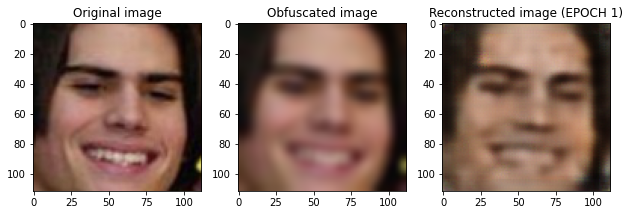

EPOCH 2/15


Train batch loss: 12516.222656: 100%|██████████| 1191/1191 [01:28<00:00, 13.46it/s]




	 VALIDATION - EPOCH 2/15 - loss: 0.027070




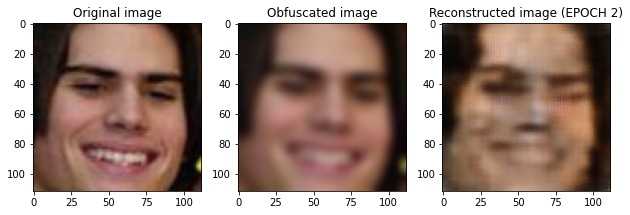

EPOCH 3/15


Train batch loss: 9400.055664: 100%|██████████| 1191/1191 [01:29<00:00, 13.28it/s]




	 VALIDATION - EPOCH 3/15 - loss: 0.026253




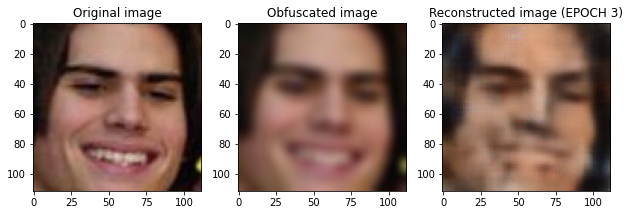

EPOCH 4/15


Train batch loss: 12656.989258: 100%|██████████| 1191/1191 [01:31<00:00, 12.95it/s]




	 VALIDATION - EPOCH 4/15 - loss: 0.024748




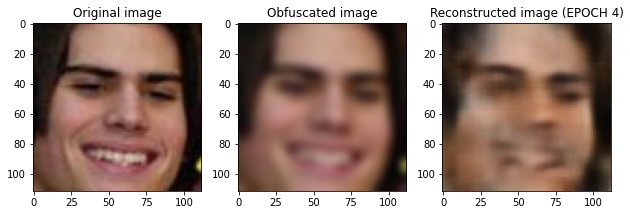

EPOCH 5/15


Train batch loss: 7574.929199: 100%|██████████| 1191/1191 [01:32<00:00, 12.93it/s]




	 VALIDATION - EPOCH 5/15 - loss: 0.023654




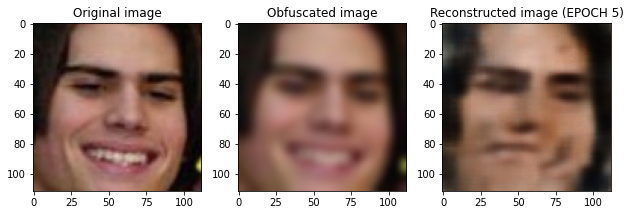

EPOCH 6/15


Train batch loss: 7983.682129: 100%|██████████| 1191/1191 [01:34<00:00, 12.56it/s]




	 VALIDATION - EPOCH 6/15 - loss: 0.023724




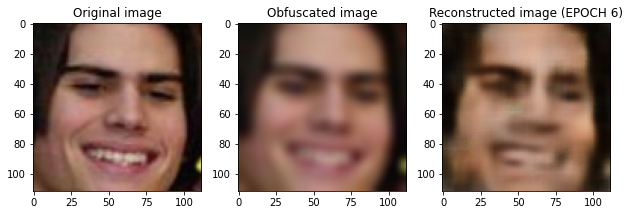

EPOCH 7/15


Train batch loss: 7200.129883: 100%|██████████| 1191/1191 [01:34<00:00, 12.63it/s]




	 VALIDATION - EPOCH 7/15 - loss: 0.023776




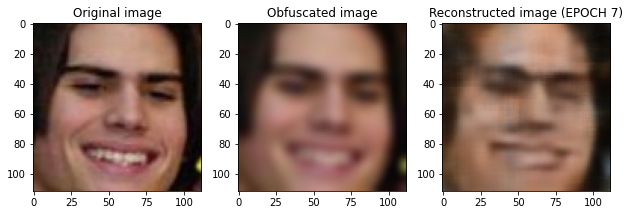

EPOCH 8/15


Train batch loss: 9924.560547: 100%|██████████| 1191/1191 [01:34<00:00, 12.63it/s]




	 VALIDATION - EPOCH 8/15 - loss: 0.022473




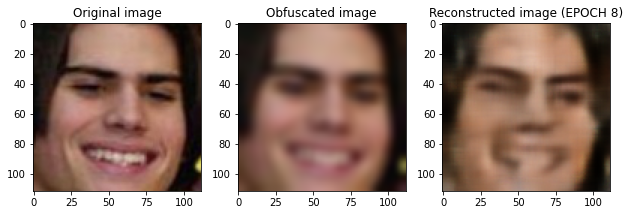

EPOCH 9/15


Train batch loss: 6267.653320: 100%|██████████| 1191/1191 [01:35<00:00, 12.42it/s]




	 VALIDATION - EPOCH 9/15 - loss: 0.021146




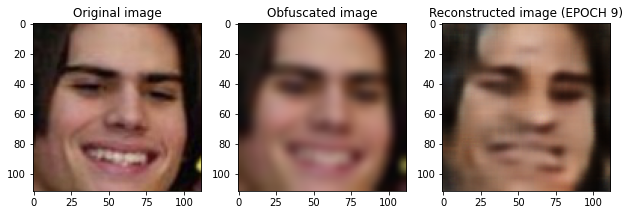

EPOCH 10/15


Train batch loss: 10379.179688: 100%|██████████| 1191/1191 [01:36<00:00, 12.39it/s]




	 VALIDATION - EPOCH 10/15 - loss: 0.021930




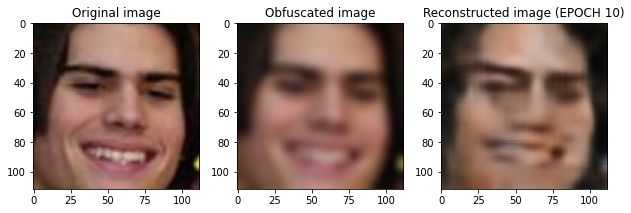

EPOCH 11/15


Train batch loss: 7825.260254: 100%|██████████| 1191/1191 [01:36<00:00, 12.34it/s]




	 VALIDATION - EPOCH 11/15 - loss: 0.021336




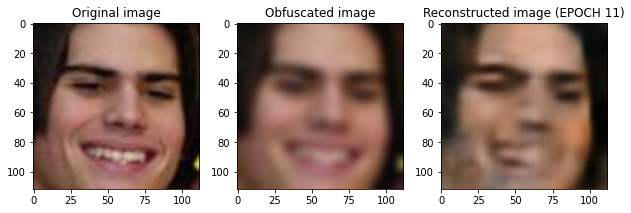

EPOCH 12/15


Train batch loss: 6390.958984: 100%|██████████| 1191/1191 [01:37<00:00, 12.17it/s]




	 VALIDATION - EPOCH 12/15 - loss: 0.021243




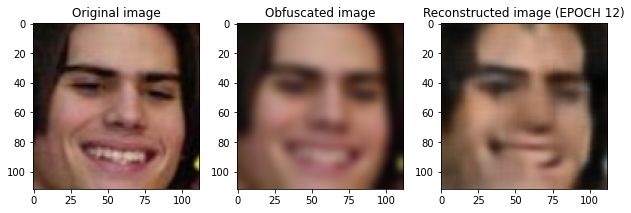

EPOCH 13/15


Train batch loss: 6031.378906: 100%|██████████| 1191/1191 [01:38<00:00, 12.09it/s]




	 VALIDATION - EPOCH 13/15 - loss: 0.020130




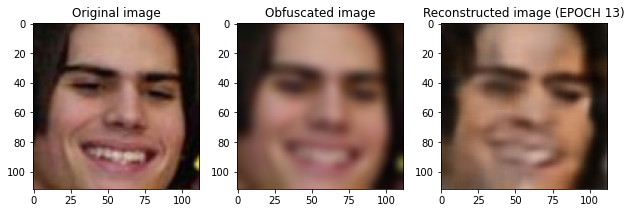

EPOCH 14/15


Train batch loss: 8423.431641: 100%|██████████| 1191/1191 [01:39<00:00, 11.92it/s]




	 VALIDATION - EPOCH 14/15 - loss: 0.020894




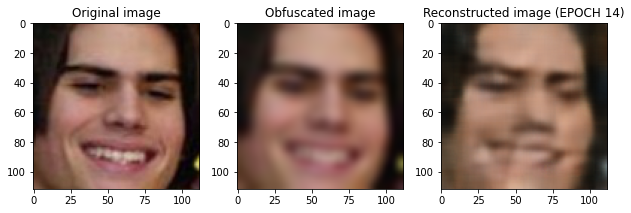

EPOCH 15/15


Train batch loss: 7234.710938: 100%|██████████| 1191/1191 [01:40<00:00, 11.82it/s]




	 VALIDATION - EPOCH 15/15 - loss: 0.018611




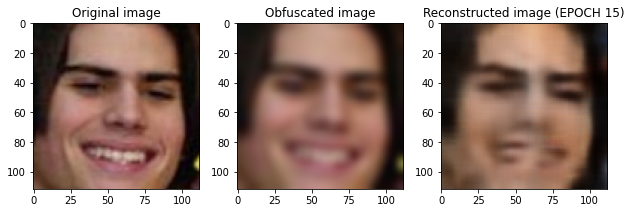

In [ ]:
VCAE_11_KL1_loss = run_training(VConvAut_11_KL1, 15, train_dataloader, test_dataloader, optim, loss_fn, device, 'VCAE_11_KL1') # alpha = 1

In [ ]:
!zip -r VCAE_11_KL1.zip VCAE_11_KL1

  adding: VCAE_11_KL1/ (stored 0%)
  adding: VCAE_11_KL1/state_dict0.pth (deflated 8%)
  adding: VCAE_11_KL1/state_dict1.pth (deflated 8%)
  adding: VCAE_11_KL1/state_dict4.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict5.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict3.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict10.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict8.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict13.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict11.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict2.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict14.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict9.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict6.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict12.pth (deflated 7%)
  adding: VCAE_11_KL1/state_dict7.pth (deflated 7%)


In [ ]:
ALPHA = 0.1

### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data, avg, log_var = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) - ALPHA * 0.5 * torch.sum(1. + log_var - avg**2 - torch.exp(log_var)) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data, avg, log_var = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = nn.MSELoss()(decoded_data, label_batch) # loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device, save_folder):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)
        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img, avg, log_var  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Obfuscated image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), f'{save_folder}/state_dict'+str(epoch)+'.pth')

    with open(f'{save_folder}_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

In [ ]:
!mkdir VCAE_11_KL01

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
VConvAut_11_KL01 = VConvAutoencoder()

### Define the loss function
loss_fn = torch.nn.MSELoss(reduction = 'sum')

### Define an optimizer 
params_to_optimize = [
    {'params': VConvAut_11_KL01.encoder.parameters()},
    {'params': VConvAut_11_KL01.decoder.parameters()},
    {'params': VConvAut_11_KL01.avg.parameters()},
    {'params': VConvAut_11_KL01.log_var.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

EPOCH 1/15


Train batch loss: 25509.529297: 100%|██████████| 1191/1191 [02:12<00:00,  8.96it/s]




	 VALIDATION - EPOCH 1/15 - loss: 0.051028




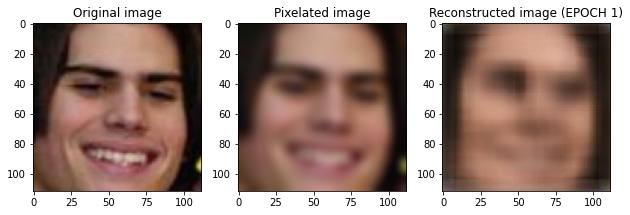

EPOCH 2/15


Train batch loss: 12133.715820: 100%|██████████| 1191/1191 [02:12<00:00,  8.99it/s]




	 VALIDATION - EPOCH 2/15 - loss: 0.038655




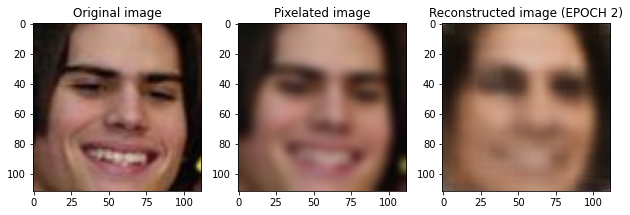

EPOCH 3/15


Train batch loss: 8806.107422: 100%|██████████| 1191/1191 [02:13<00:00,  8.94it/s]




	 VALIDATION - EPOCH 3/15 - loss: 0.033356




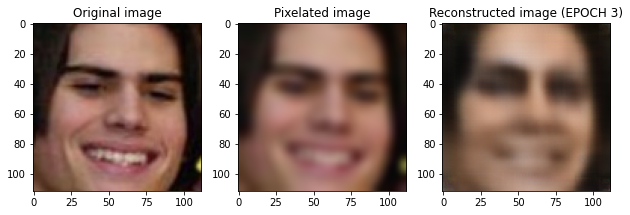

EPOCH 4/15


Train batch loss: 7206.212891: 100%|██████████| 1191/1191 [02:13<00:00,  8.89it/s]




	 VALIDATION - EPOCH 4/15 - loss: 0.029519




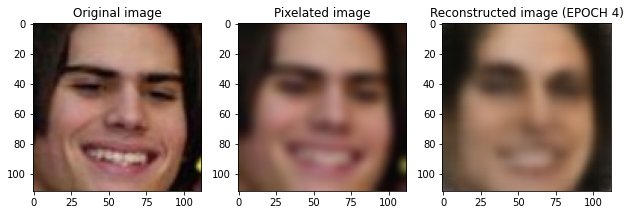

EPOCH 5/15


Train batch loss: 7438.431152: 100%|██████████| 1191/1191 [02:15<00:00,  8.79it/s]




	 VALIDATION - EPOCH 5/15 - loss: 0.026942




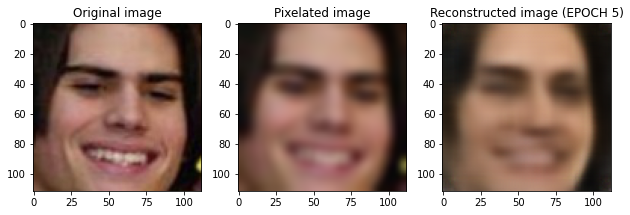

EPOCH 6/15


Train batch loss: 7697.041504: 100%|██████████| 1191/1191 [02:16<00:00,  8.70it/s]




	 VALIDATION - EPOCH 6/15 - loss: 0.025312




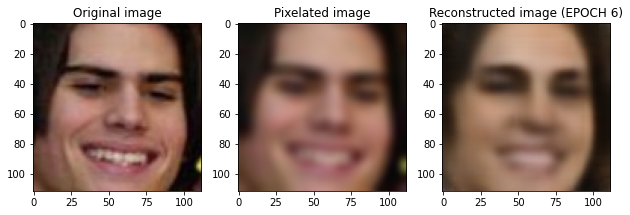

EPOCH 7/15


Train batch loss: 5199.676758: 100%|██████████| 1191/1191 [02:17<00:00,  8.66it/s]




	 VALIDATION - EPOCH 7/15 - loss: 0.023633




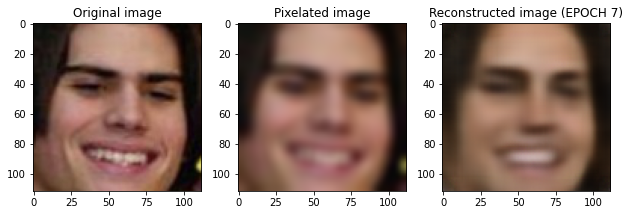

EPOCH 8/15


Train batch loss: 9125.131836: 100%|██████████| 1191/1191 [02:18<00:00,  8.62it/s]




	 VALIDATION - EPOCH 8/15 - loss: 0.022641




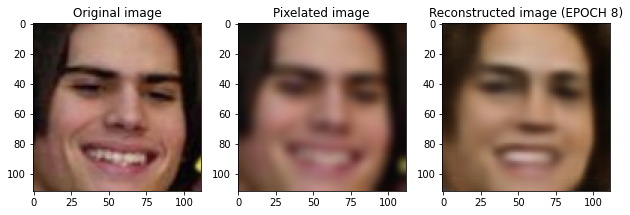

EPOCH 9/15


Train batch loss: 6834.644043: 100%|██████████| 1191/1191 [02:19<00:00,  8.53it/s]




	 VALIDATION - EPOCH 9/15 - loss: 0.021330




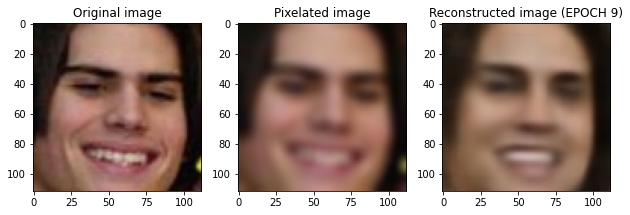

EPOCH 10/15


Train batch loss: 5551.650391: 100%|██████████| 1191/1191 [02:20<00:00,  8.48it/s]




	 VALIDATION - EPOCH 10/15 - loss: 0.020108




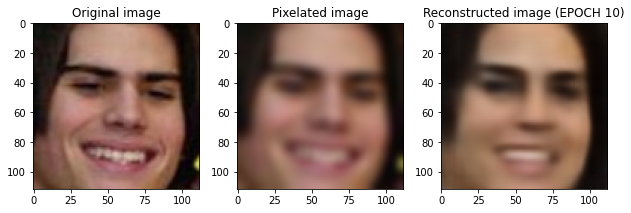

EPOCH 11/15


Train batch loss: 7511.416992: 100%|██████████| 1191/1191 [02:20<00:00,  8.50it/s]




	 VALIDATION - EPOCH 11/15 - loss: 0.019277




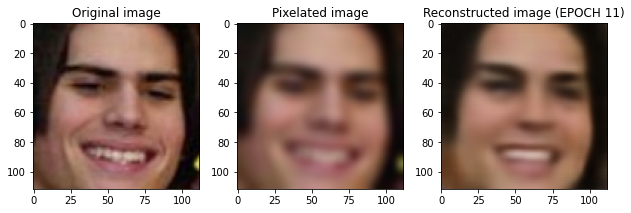

EPOCH 12/15


Train batch loss: 5736.508789: 100%|██████████| 1191/1191 [02:20<00:00,  8.46it/s]




	 VALIDATION - EPOCH 12/15 - loss: 0.019383




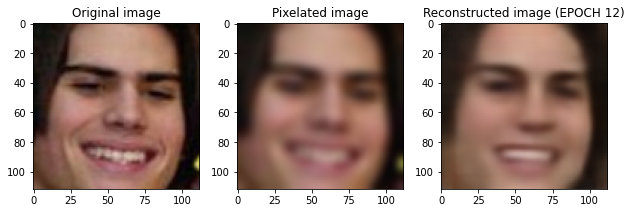

EPOCH 13/15


Train batch loss: 4639.624023: 100%|██████████| 1191/1191 [02:21<00:00,  8.43it/s]




	 VALIDATION - EPOCH 13/15 - loss: 0.018114




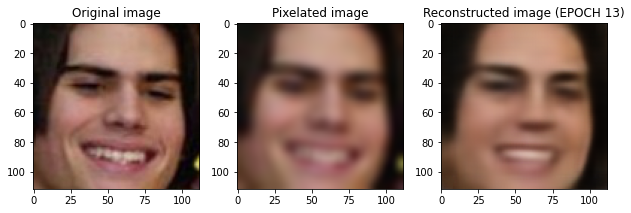

EPOCH 14/15


Train batch loss: 6150.335449: 100%|██████████| 1191/1191 [02:22<00:00,  8.37it/s]




	 VALIDATION - EPOCH 14/15 - loss: 0.018425




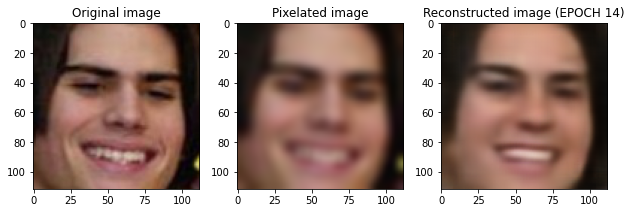

EPOCH 15/15


Train batch loss: 5666.975586: 100%|██████████| 1191/1191 [02:22<00:00,  8.33it/s]




	 VALIDATION - EPOCH 15/15 - loss: 0.017742




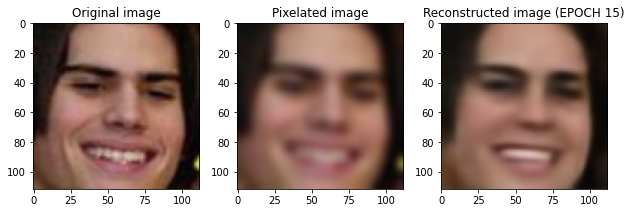

In [ ]:
VCAE_11_KL01_loss = run_training(VConvAut_11_KL01, 15, train_dataloader, test_dataloader, optim, loss_fn, device, 'VCAE_11_KL01') # alpha = 0.1

In [ ]:
!zip -r VCAE_11_KL01.zip VCAE_11_KL01

  adding: VCAE_11_KL01/ (stored 0%)
  adding: VCAE_11_KL01/state_dict8.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict0.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict6.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict12.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict9.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict14.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict1.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict11.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict7.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict2.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict13.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict5.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict10.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict4.pth (deflated 7%)
  adding: VCAE_11_KL01/state_dict3.pth (deflated 7%)


## PCA eccetera

In [ ]:
!pip install torchmetrics

In [ ]:
import torch
import torchvision
from torch import nn
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import trange, tqdm
from torch.utils.data import Dataset, DataLoader, random_split
import os
from PIL import Image
from torchvision import transforms
import pickle
# from torchmetrics import PSNR, SSIM
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
import torch.nn.functional as F
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import seaborn as sns

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

In [ ]:
initial_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.Normalize(0.5,0.5)])

blur_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.GaussianBlur(9,4),
    transforms.Normalize(0.5,0.5)])

In [ ]:
class AutoEncodeDataset(Dataset):
    """"""

    def __init__(self, dataset_gt, dataset_blur):
        self.dataset_gt = dataset_gt
        self.dataset_blur = dataset_blur

    def __len__(self):
        return len(self.dataset_gt)

    def __getitem__(self, idx):
        x, _ = self.dataset_blur.__getitem__(idx)
        y, _ = self.dataset_gt.__getitem__(idx)
        return x, y

In [ ]:
data_dir = 'lfw_torch/'

train_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=blur_transform)
)

test_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=blur_transform)
)

In [ ]:
batch_size = 8

N_val = int(len(train_dataset)*0.2)
train_dataset_red, val_dataset = random_split(train_dataset, 
                                 lengths=[len(train_dataset)-N_val, N_val], 
                                 generator=torch.Generator().manual_seed(42))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0,)
train_dataloader_red = DataLoader(train_dataset_red, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [ ]:
def plotrescale(data):
    return np.dstack(data)*0.5 + 0.5

In [ ]:
class ConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

    #     self.avg = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )

    #     self.log_var = nn.Sequential(
    #         nn.ConvTranspose2d(256, 256, 1),
    #         nn.BatchNorm2d(256),
    #         #nn.ReLU(),
    #     )
        
    # def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
    #     sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
    #     return mu + torch.randn_like(mu) * sigma
    #     #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        # avg = self.avg(x)
        # log_var = self.log_var(x)
        # x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var

In [ ]:
class VConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )

        self.avg = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )

        self.log_var = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 1),
            nn.BatchNorm2d(256),
            #nn.ReLU(),
        )
        
    def sample_in_latent_space(self, mu, log_var): # sampling from MVN in latent space with provided mean and variances
        sigma = torch.exp(0.5 * log_var) #log_var is log(variance) = log(sigma**2) = 2 * log(sigma)
        return mu + torch.randn_like(mu) * sigma
        #Var(aX) = a**2 Var(X), so we need to multiply pred_sqrt_var = sigma (square root of the variance) by the standard normal distribution

    def forward(self, x):
        x = self.encoder(x)
        avg = self.avg(x)
        log_var = self.log_var(x)
        x = self.sample_in_latent_space(avg, log_var)
        x = self.decoder(x)
        return x#, avg, log_var

In [ ]:
cae = ConvAutoencoder()
cae.load_state_dict(torch.load('./cae.pth'))

vcae = VConvAutoencoder()
vcae.load_state_dict(torch.load('./vcae.pth'))

In [ ]:
!wget https://www.dropbox.com/s/0n81mksdi6g8pvg/funneled_selezionati.zip && unzip funneled_selezionati.zip

--2022-09-17 14:35:26--  https://www.dropbox.com/s/0n81mksdi6g8pvg/funneled_selezionati.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.8.18, 2620:100:6019:18::a27d:412
Connecting to www.dropbox.com (www.dropbox.com)|162.125.8.18|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /s/raw/0n81mksdi6g8pvg/funneled_selezionati.zip [following]
--2022-09-17 14:35:26--  https://www.dropbox.com/s/raw/0n81mksdi6g8pvg/funneled_selezionati.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc23305e4877641c36fa7b50ea39.dl.dropboxusercontent.com/cd/0/inline/BtF4BFdUZ1iOhnGKywU3Vo2ClMwt3ODsgB_5zKZvo-q2ZgJsO2gjPN5o5Zzc-7gXyRuKCoClg7ABdSCrarDoZlpUi27f7RCJE8STUayRdtUTteZAzm3Y--M6w7CzNEqM0izVftKPf-9M65hAMCjZKMArj03qtJAb0aXpMNFKvTmgFg/file# [following]
--2022-09-17 14:35:27--  https://uc23305e4877641c36fa7b50ea39.dl.dropboxusercontent.com/cd/0/inline/BtF4BFdUZ1iOhnGKywU3Vo2ClMwt3ODsgB_5zKZvo-q2

In [ ]:
base_path = './funneled_selezionati/'
actor_list = ['Angelina_Jolie', 'Bill_Gates', 'Jennifer_Aniston', 'Jennifer_Lopez', 'Meryl_Streep'] + ['Leonardo_DiCaprio', 'Luciano_Pavarotti', 'Lucy_Liu']
lengths = []

for actor in actor_list:
    path = base_path + actor + '/'
    lengths.append(len(os.listdir(path)))

labels = np.repeat(actor_list, lengths) # https://stackoverflow.com/questions/12235552/r-function-rep-in-python-replicates-elements-of-a-list-vector
# print(labels)

In [ ]:
inputs = torch.zeros([sum(lengths), 3, 112, 112])

i = 0

for actor in actor_list:
    for file in os.listdir(base_path + actor):
        inputs[i,...] = initial_transform(Image.open(base_path + actor + f'/{file}'))
        i += 1

In [ ]:
cae.eval()
encoded_inputs_cae = cae.encoder(inputs)

vcae.eval()
encoded_inputs_vcae = vcae.avg(vcae.encoder(inputs))

In [ ]:
pca_cae = PCA(n_components = 2)
points_pca_cae = pca_cae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_cae.detach()))

In [ ]:
pca_vcae = PCA(n_components = 2)
points_pca_vcae = pca_vcae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_vcae.detach()))

In [ ]:
sns.scatterplot(x = points_pca_cae[:,0], y = points_pca_cae[:,1], hue = labels, legend = 'auto')

In [ ]:
sns.scatterplot(x = points_pca_vcae[:,0], y = points_pca_vcae[:,1], hue = labels, legend = 'auto')

In [ ]:
tsne_cae = TSNE(n_components = 2)
points_tsne_cae = tsne_cae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_cae.detach()))
sns.scatterplot(x = points_tsne_cae[:,0], y = points_tsne_cae[:,1], hue = labels, legend = 'auto')

In [ ]:
tsne_vcae = TSNE(n_components = 2)
points_tsne_vcae = tsne_vcae.fit_transform(nn.Flatten(start_dim = 1)(encoded_inputs_vcae.detach()))
sns.scatterplot(x = points_tsne_cae[:,0], y = points_tsne_cae[:,1], hue = labels, legend = 'auto')

## Resblock

In [ ]:
!pip install torchmetrics

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 419 kB 26.3 MB/s 


In [ ]:
import matplotlib.pyplot as plt # plotting library
import numpy as np # this module is useful to work with numerical arrays
import pandas as pd # this module is useful to work with tabular data
import random # this module will be used to select random samples from a collection
import os # this module will be used just to create directories in the local filesystem
from tqdm import tqdm # this module is useful to plot progress bars
import pickle

import torch
import torchvision
from torchvision import transforms
from torchmetrics import PeakSignalNoiseRatio, StructuralSimilarityIndexMeasure
from torch.utils.data import Dataset, DataLoader, random_split
from torch import nn
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

In [ ]:
# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')

Selected device: cuda


In [ ]:
class AutoEncodeDataset(Dataset):
    """"""

    def __init__(self, dataset_gt, dataset_blur):
        self.dataset_gt = dataset_gt
        self.dataset_blur = dataset_blur

    def __len__(self):
        return len(self.dataset_gt)

    def __getitem__(self, idx):
        x, _ = self.dataset_blur.__getitem__(idx)
        y, _ = self.dataset_gt.__getitem__(idx)
        return x, y

In [ ]:
def metric_insight(psnr_vec, ssim_vec, dataset):
  print('AVG PSNR: '+str(psnr_vec.mean()))
  print('MAX PSNR: '+str(psnr_vec.max()))
  print('AVG SSIM: '+str(ssim_vec.mean()))
  print('MAX SSIM: '+str(ssim_vec.max()))

def mymetrics(model, device, dataset, verbose=True):
  psnr, ssim = PeakSignalNoiseRatio().to(device), StructuralSimilarityIndexMeasure().to(device)
  psnr_values = np.zeros(len(dataset))
  ssim_values = np.zeros(len(dataset))
  model.to(device)
  model.eval()
  for ix, sample in tqdm(enumerate(dataset)):
    img = sample[0].unsqueeze(0).to(device)
    lab = sample[1].unsqueeze(0).to(device)
    with torch.no_grad():
        rec_img  = model(img)
    psnr_values[ix], ssim_values[ix] = psnr(rec_img, lab).cpu().numpy(), ssim(rec_img, lab).cpu().numpy()

  if (verbose==True):
    print('\n')
    metric_insight(psnr_values, ssim_values, dataset)
  return psnr_values, ssim_values

In [ ]:
initial_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.Normalize(0.5,0.5)])

blur_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.CenterCrop(112),
    transforms.GaussianBlur(9,4),
    transforms.Normalize(0.5,0.5)])

In [ ]:
data_dir = 'data_lfw/'

train_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='train', download=True, transform=blur_transform)
)

test_dataset = AutoEncodeDataset(
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=initial_transform),
    torchvision.datasets.LFWPeople(data_dir, split='test', download=True, transform=blur_transform)
)

  0%|          | 0/243346528 [00:00<?, ?it/s]

Extracting data_lfw/lfw-py/lfw-funneled.tgz to data_lfw/lfw-py


  0%|          | 0/66403 [00:00<?, ?it/s]

  0%|          | 0/94727 [00:00<?, ?it/s]

Files already downloaded and verified
Using downloaded and verified file: data_lfw/lfw-py/lfw-funneled.tgz
Extracting data_lfw/lfw-py/lfw-funneled.tgz to data_lfw/lfw-py


  0%|          | 0/28334 [00:00<?, ?it/s]

Using downloaded and verified file: data_lfw/lfw-py/lfw-names.txt
Files already downloaded and verified


In [ ]:
batch_size = 8

N_val = int(len(train_dataset)*0.2)
train_dataset_red, val_dataset = random_split(train_dataset, 
                                 lengths=[len(train_dataset)-N_val, N_val], 
                                 generator=torch.Generator().manual_seed(42))
train_dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=0,)
train_dataloader_red = DataLoader(train_dataset_red, batch_size=batch_size, shuffle=True, num_workers=0)
val_dataloader   = DataLoader(val_dataset, batch_size=batch_size, shuffle=True, num_workers=0)
test_dataloader  = DataLoader(test_dataset, batch_size=batch_size, shuffle=True, num_workers=0)

In [ ]:
def plotrescale(data):
    return np.dstack(data)*0.5 + 0.5

In [ ]:
class RESConvAutoencoder(nn.Module):
    
    def __init__(self):
        super().__init__()
        
        ## Encoder
        # N, 3, 112, 112
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, 9), # N, 16, 104, 104
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, 4, stride=2, padding=1), # N, 32, 51, 52
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, stride=2, padding=1), # N, 32, 26
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 256, 4, stride=2), # N, 32, 12
            nn.BatchNorm2d(256),
            nn.ReLU(),
        )

        self.resblock1 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )

        self.resblock2 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )

        self.resblock3 = nn.Sequential(
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        
        ## Decoder
        # N, 64, 1, 1
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 256, 4, stride=2), # N, 32, 10, 10
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.ConvTranspose2d(256, 128, 4, stride=2, padding=1), # N, 16, 28, 28
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 4, stride=2, padding=1), # N, 16, 56, 56
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 3, 9),
            nn.Tanh()  
        )
        
    def forward(self, x):
        x = self.encoder(x)
        x = x + self.resblock1(x)
        x = x + self.resblock2(x)
        x = x + self.resblock3(x)
        x = self.decoder(x)
        return x
    
### Training cycle function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    model.train()
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    foo = tqdm(dataloader)
    for image_batch, label_batch in foo: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        image_batch = image_batch.to(device)
        label_batch = label_batch.to(device)
        # Encode-Decode data
        decoded_data = model(image_batch)
        ##
        #latent_img = model.encoder(image_batch)
        #latent_lab = model.encoder(label_batch)
        # Evaluate loss
        loss = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        foo.set_description('Train batch loss: %f' % (loss.data))

### Testing cycle function
def test_epoch(model, device, dataloader, loss_fn):
    model.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        val_loss = []
        for image_batch, label_batch in dataloader:
            # Move tensor to the proper device
            image_batch = image_batch.to(device)
            label_batch = label_batch.to(device)
            # Encode-Decode data
            decoded_data = model(image_batch)
            ##
            #latent_img = model.encoder(image_batch)
            #latent_lab = model.encoder(label_batch)
            # Batch loss
            loss_batch = loss_fn(decoded_data, label_batch) #+ loss_fn(latent_img, latent_lab)
            # Append the loss
            val_loss.append(loss_batch.detach().cpu().numpy())
    return np.mean(val_loss)

### Trainer
def run_training(model, num_epochs, train_dataloader, val_dataloader, optim, loss_fn, device):
    model.to(device)
    val_loss_log = []
    for epoch in range(num_epochs):
        print('EPOCH %d/%d' % (epoch + 1, num_epochs))
        ### Training
        train_epoch(
            model=model,
            device=device, 
            dataloader=train_dataloader, 
            loss_fn=loss_fn, 
            optimizer=optim)
        ### Validation  (use the testing function)
        val_loss = test_epoch(
            model=model,
            device=device, 
            dataloader=val_dataloader, 
            loss_fn=loss_fn)
        # Print Validationloss
        print('\n\n\t VALIDATION - EPOCH %d/%d - loss: %f\n\n' % (epoch + 1, num_epochs, val_loss))
        val_loss_log.append(val_loss)

        ### Plot progress
        # Get the output of a specific image (the test image at index 0 in this case)
        img = test_dataset[0][0].unsqueeze(0).to(device)
        lab = test_dataset[0][1].unsqueeze(0).to(device)
        model.eval()
        with torch.no_grad():
            rec_img  = model(img)
        # Plot the reconstructed image
        fig, axs = plt.subplots(1, 3, figsize=(9,3))
        axs[0].imshow(plotrescale(lab.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[0].set_title('Original image')
        axs[1].imshow(plotrescale(img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[1].set_title('Blurred image')
        axs[2].imshow(plotrescale(rec_img.cpu().squeeze().numpy()), cmap='gist_gray')
        axs[2].set_title('Reconstructed image (EPOCH %d)' % (epoch + 1))
        plt.tight_layout()
        plt.pause(0.1)
        plt.show()
        plt.close()

        # Save network parameters
        torch.save(model.state_dict(), 'RESCAE/state_dict'+str(epoch)+'.pth')

    with open('RESCAE_validation_loss', 'wb') as fp:
        pickle.dump(val_loss_log, fp)

    return  val_loss_log

In [ ]:
### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
RESConvAut = RESConvAutoencoder()

### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer 
params_to_optimize = [
    {'params': RESConvAut.encoder.parameters()},
    {'params': RESConvAut.resblock1.parameters()},
    {'params': RESConvAut.resblock2.parameters()},
    {'params': RESConvAut.resblock3.parameters()},
    {'params': RESConvAut.decoder.parameters()}
]
optim = torch.optim.Adam(params_to_optimize, lr=5e-4, weight_decay=1e-5)

In [ ]:
!mkdir RESCAE

EPOCH 1/15


Train batch loss: 0.028227: 100%|██████████| 1191/1191 [01:48<00:00, 10.96it/s]




	 VALIDATION - EPOCH 1/15 - loss: 0.014545




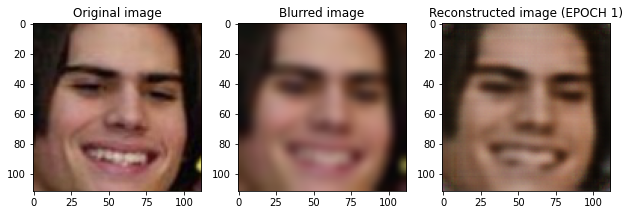

EPOCH 2/15


Train batch loss: 0.023280: 100%|██████████| 1191/1191 [01:41<00:00, 11.69it/s]




	 VALIDATION - EPOCH 2/15 - loss: 0.013188




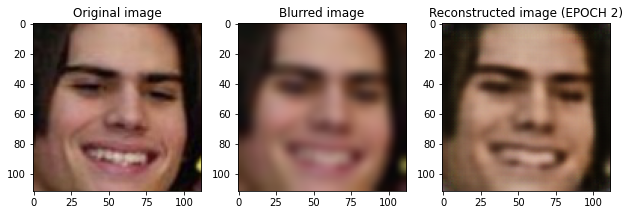

EPOCH 3/15


Train batch loss: 0.017976: 100%|██████████| 1191/1191 [01:45<00:00, 11.30it/s]




	 VALIDATION - EPOCH 3/15 - loss: 0.007725




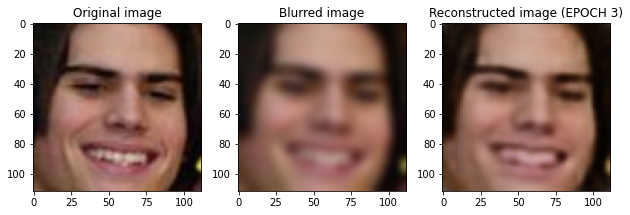

EPOCH 4/15


Train batch loss: 0.012412: 100%|██████████| 1191/1191 [01:44<00:00, 11.38it/s]




	 VALIDATION - EPOCH 4/15 - loss: 0.010033




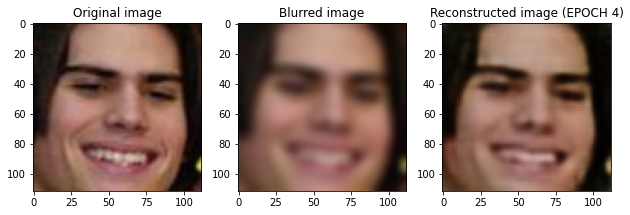

EPOCH 5/15


Train batch loss: 0.020311: 100%|██████████| 1191/1191 [01:45<00:00, 11.25it/s]




	 VALIDATION - EPOCH 5/15 - loss: 0.006608




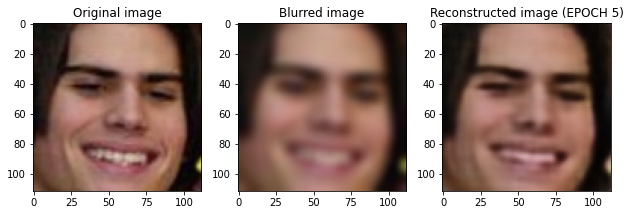

EPOCH 6/15


Train batch loss: 0.017645: 100%|██████████| 1191/1191 [01:47<00:00, 11.10it/s]




	 VALIDATION - EPOCH 6/15 - loss: 0.006034




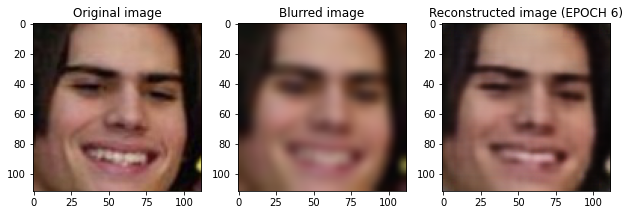

EPOCH 7/15


Train batch loss: 0.008115: 100%|██████████| 1191/1191 [01:47<00:00, 11.05it/s]




	 VALIDATION - EPOCH 7/15 - loss: 0.006055




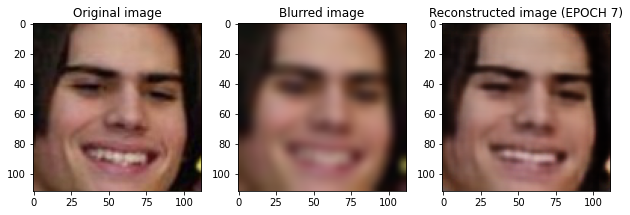

EPOCH 8/15


Train batch loss: 0.006634: 100%|██████████| 1191/1191 [01:48<00:00, 10.96it/s]




	 VALIDATION - EPOCH 8/15 - loss: 0.005200




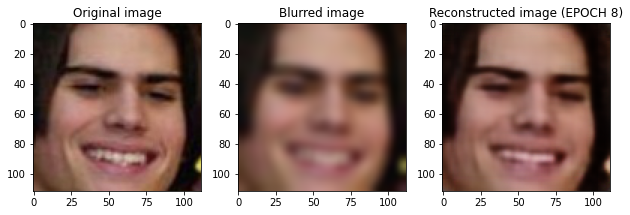

EPOCH 9/15


Train batch loss: 0.007782: 100%|██████████| 1191/1191 [01:47<00:00, 11.11it/s]




	 VALIDATION - EPOCH 9/15 - loss: 0.004259




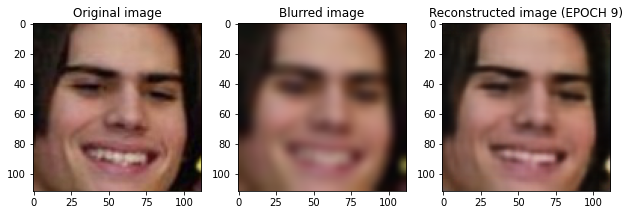

EPOCH 10/15


Train batch loss: 0.007646: 100%|██████████| 1191/1191 [01:47<00:00, 11.11it/s]




	 VALIDATION - EPOCH 10/15 - loss: 0.006992




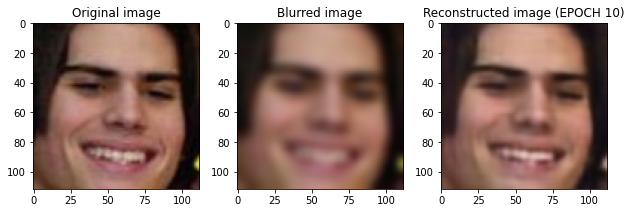

EPOCH 11/15


Train batch loss: 0.005254: 100%|██████████| 1191/1191 [01:48<00:00, 11.01it/s]




	 VALIDATION - EPOCH 11/15 - loss: 0.004356




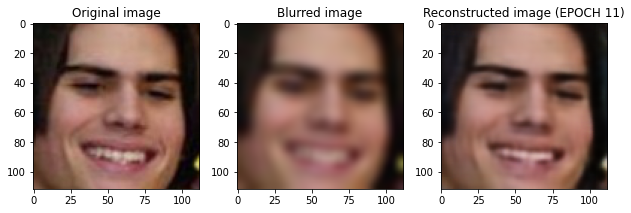

EPOCH 12/15


Train batch loss: 0.005376: 100%|██████████| 1191/1191 [01:48<00:00, 10.96it/s]




	 VALIDATION - EPOCH 12/15 - loss: 0.004398




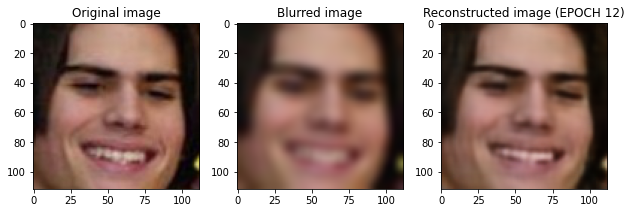

EPOCH 13/15


Train batch loss: 0.006876: 100%|██████████| 1191/1191 [01:49<00:00, 10.90it/s]




	 VALIDATION - EPOCH 13/15 - loss: 0.005377




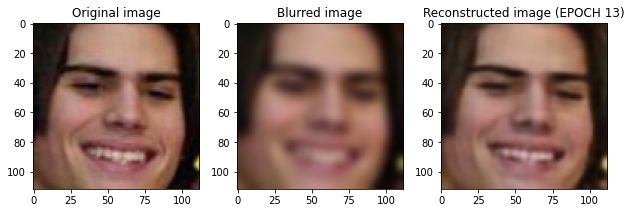

EPOCH 14/15


Train batch loss: 0.017081: 100%|██████████| 1191/1191 [01:49<00:00, 10.83it/s]




	 VALIDATION - EPOCH 14/15 - loss: 0.004631




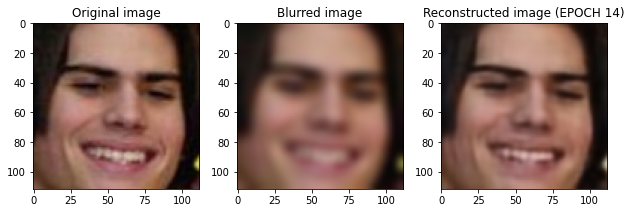

EPOCH 15/15


Train batch loss: 0.006226: 100%|██████████| 1191/1191 [01:50<00:00, 10.76it/s]




	 VALIDATION - EPOCH 15/15 - loss: 0.005759




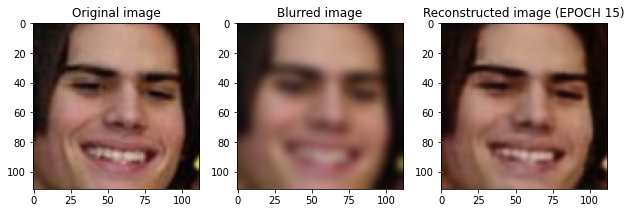

In [ ]:
RESCAE_loss = run_training(RESConvAut, 15, train_dataloader, test_dataloader, optim, loss_fn, device)

In [ ]:
!zip -r RESCAE.zip RESCAE

  adding: RESCAE/ (stored 0%)
  adding: RESCAE/state_dict0.pth (deflated 8%)
  adding: RESCAE/state_dict1.pth (deflated 7%)
  adding: RESCAE/state_dict4.pth (deflated 7%)
  adding: RESCAE/state_dict5.pth (deflated 7%)
  adding: RESCAE/state_dict3.pth (deflated 7%)
  adding: RESCAE/state_dict10.pth (deflated 5%)
  adding: RESCAE/state_dict8.pth (deflated 5%)
  adding: RESCAE/state_dict13.pth (deflated 7%)
  adding: RESCAE/state_dict11.pth (deflated 6%)
  adding: RESCAE/state_dict2.pth (deflated 7%)
  adding: RESCAE/state_dict14.pth (deflated 8%)
  adding: RESCAE/state_dict9.pth (deflated 5%)
  adding: RESCAE/state_dict6.pth (deflated 6%)
  adding: RESCAE/state_dict12.pth (deflated 6%)
  adding: RESCAE/state_dict7.pth (deflated 6%)
